In [1]:
# Import libraries
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
import sweetviz as sv
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
# Surpress warnings 
import warnings
warnings.filterwarnings('ignore')

In [3]:
df=pd.read_csv(Path("Data/kc_house_data.csv"),index_col="id")
df.shape

(21613, 20)

#### Generating report for features

                                             |          | [  0%]   00:00 -> (? left)

Report Reports/exploratory_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



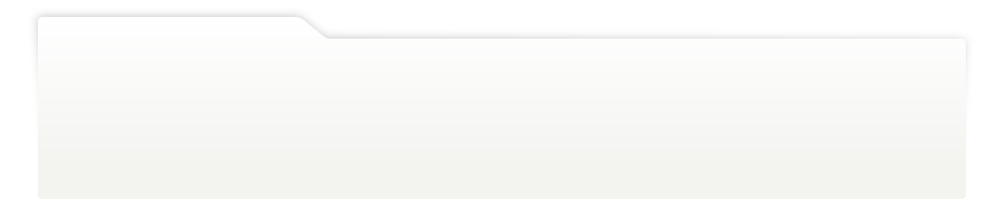
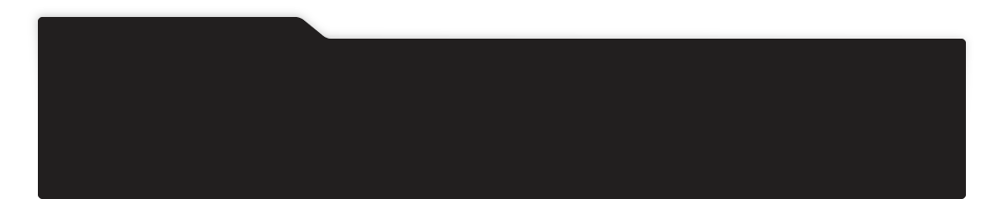
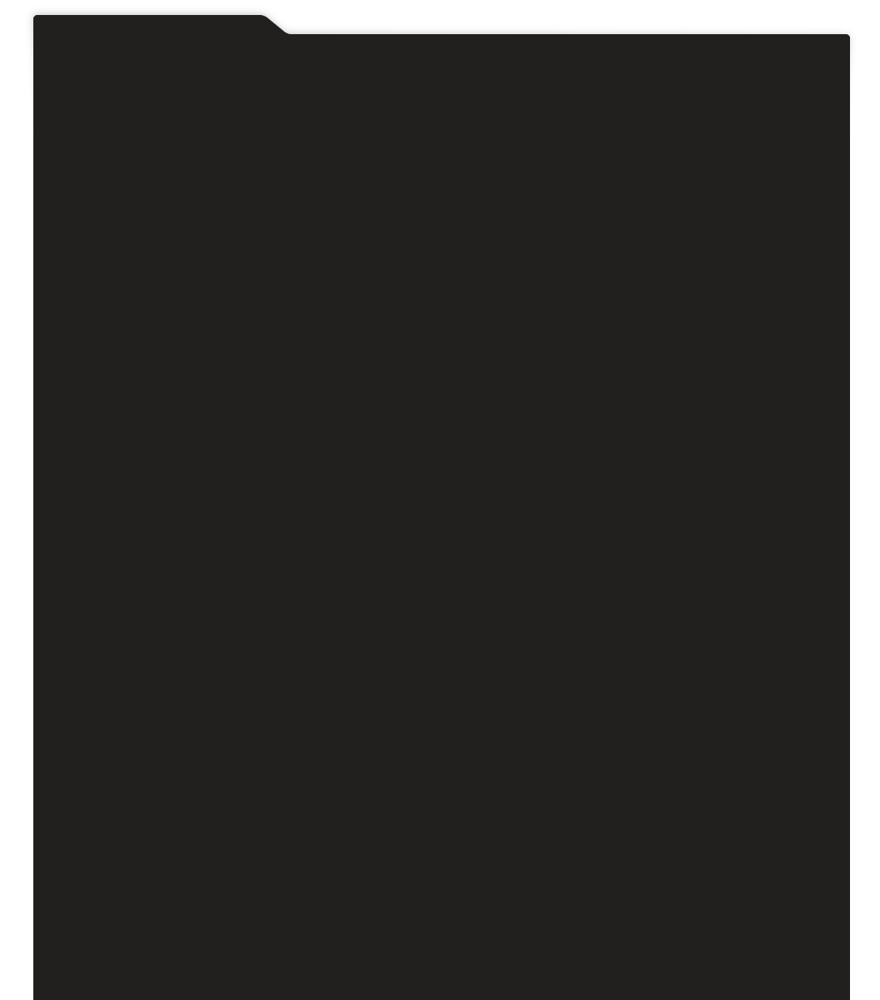
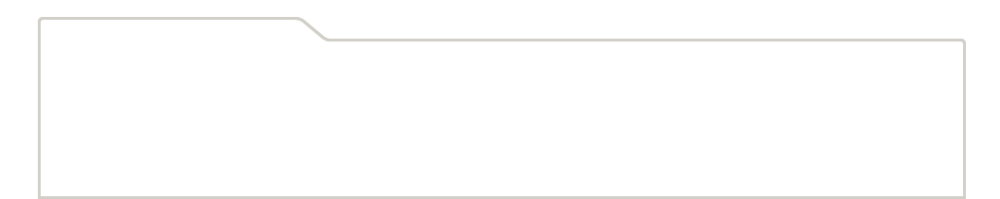
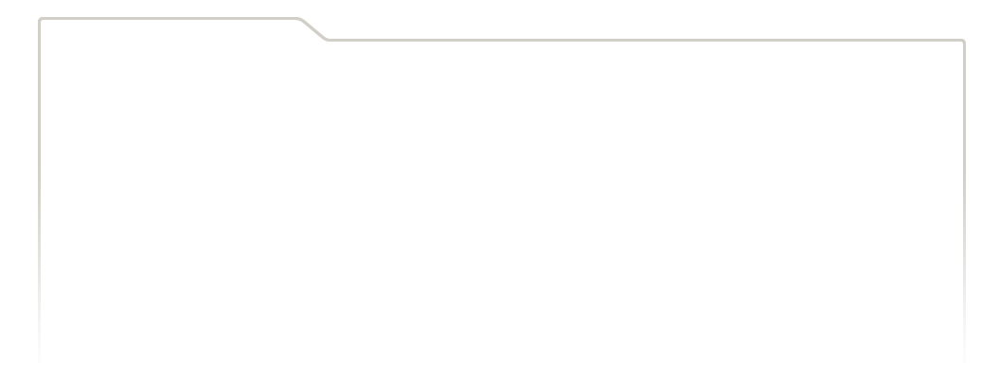
...
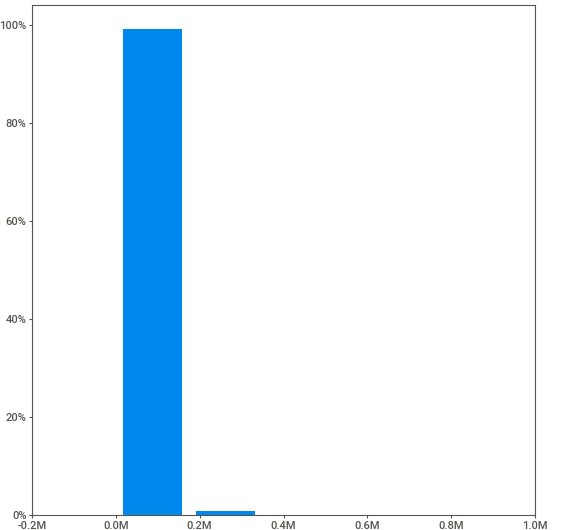
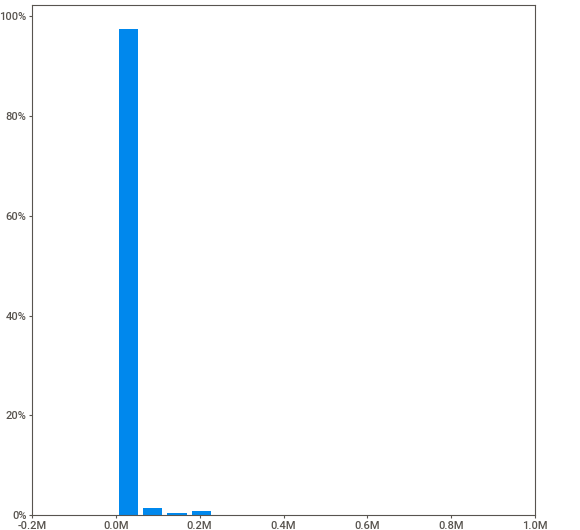
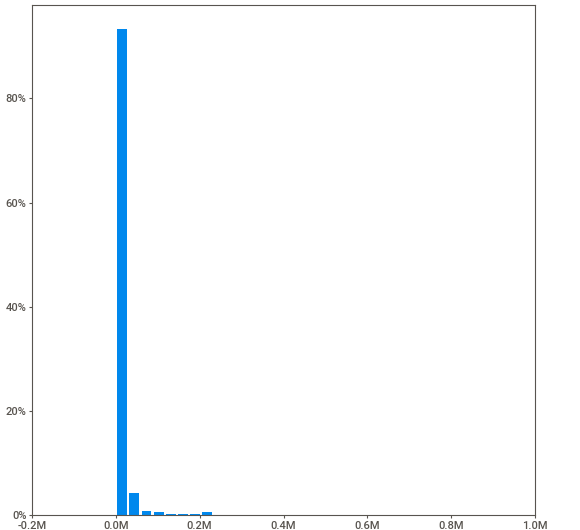
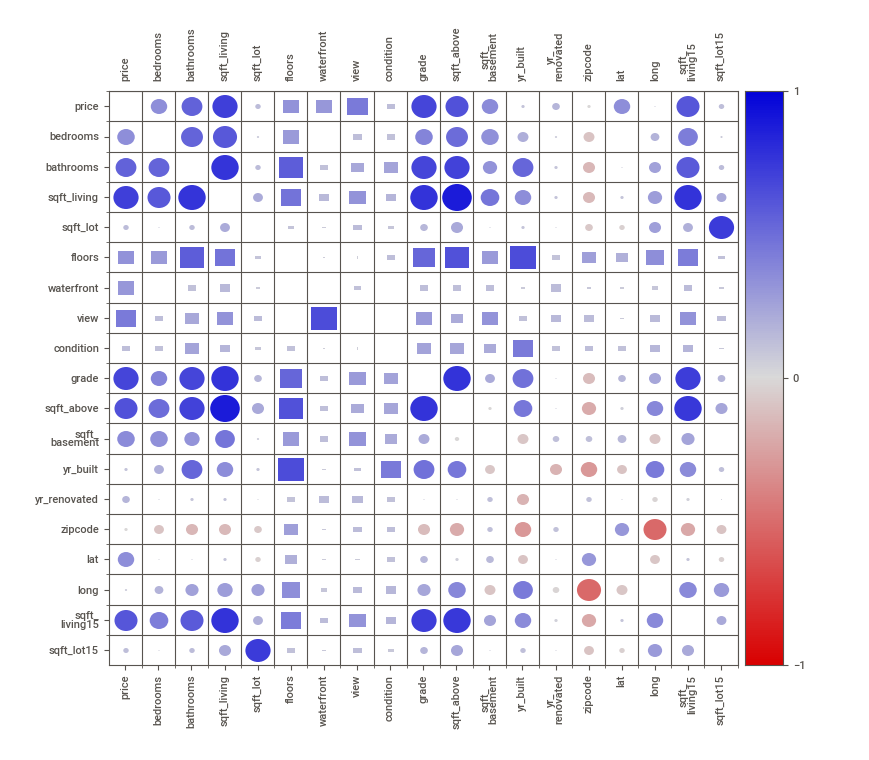
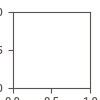

In [4]:
my_report=sv.analyze(df,pairwise_analysis="on")
my_report.show_html("Reports/exploratory_report.html")
my_report.show_notebook(layout='widescreen', w=1300)

In [5]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,,,,,,,,,,,,,,,,,,,,
7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Find which ML model works the best on the raw data

In [6]:
#Defining various models

#1. Linear Regressor model
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

#2. Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor(random_state=1,criterion='mse',max_depth=10)

#3.Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(random_state=1,n_estimators=100,max_depth=10)

#4. KNN
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsRegressor
knn=KNeighborsRegressor(n_neighbors=10)

#5.Boosting
from sklearn.ensemble import GradientBoostingRegressor
grboost=GradientBoostingRegressor(random_state=1)

In [7]:

# define target feature to the y variable
y=df["price"]
# Separate the X variable, the features
X=df.drop(["price","date"],axis=1)

# Split the preprocessed data into a training and testing dataset
# Assign the function a random_state equal to 1
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=1)

In [8]:

# Create a function that returns train and test accuracy of different models.

def accuracy(model):
    model.fit(X_train,y_train)
#   train_accuracy = model.score(X_train, y_train)
    train_accuracy = model.score(X_train, y_train)
    train_accuracy = np.round(train_accuracy*100, 2)
    test_accuracy = model.score(X_test, y_test)
    test_accuracy = np.round(test_accuracy*100, 2)
    return train_accuracy,test_accuracy

In [9]:
# Create DataFrame that illustrates the accuracy of tmodels
accuracy=pd.DataFrame([accuracy(lr), accuracy(dt), accuracy(rf), 
                                           accuracy(knn), accuracy(grboost)])
accuracy.index = ['LinearReg', 'DecisionTree','RandomForest','KNN','GradienBoost']
accuracy.columns=['Train_accuracy(%)','Test_accuracy(%)']
sorted_accuracy_df = accuracy.sort_values(by = 'Train_accuracy(%)', ascending = False)
sorted_accuracy_df

,Train_accuracy(%),Test_accuracy(%)
RandomForest,93.39,85.17
DecisionTree,91.33,80.82
GradienBoost,90.04,85.98
LinearReg,70.48,68.62
KNN,61.45,49.07


<AxesSubplot:>

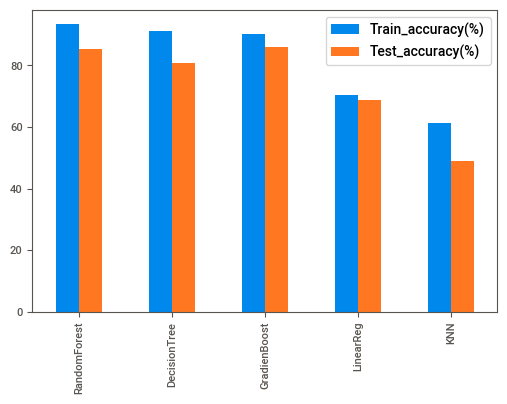

In [10]:
sorted_accuracy_df.plot(kind="bar")

## Exploratory Data Analysis

<AxesSubplot:>

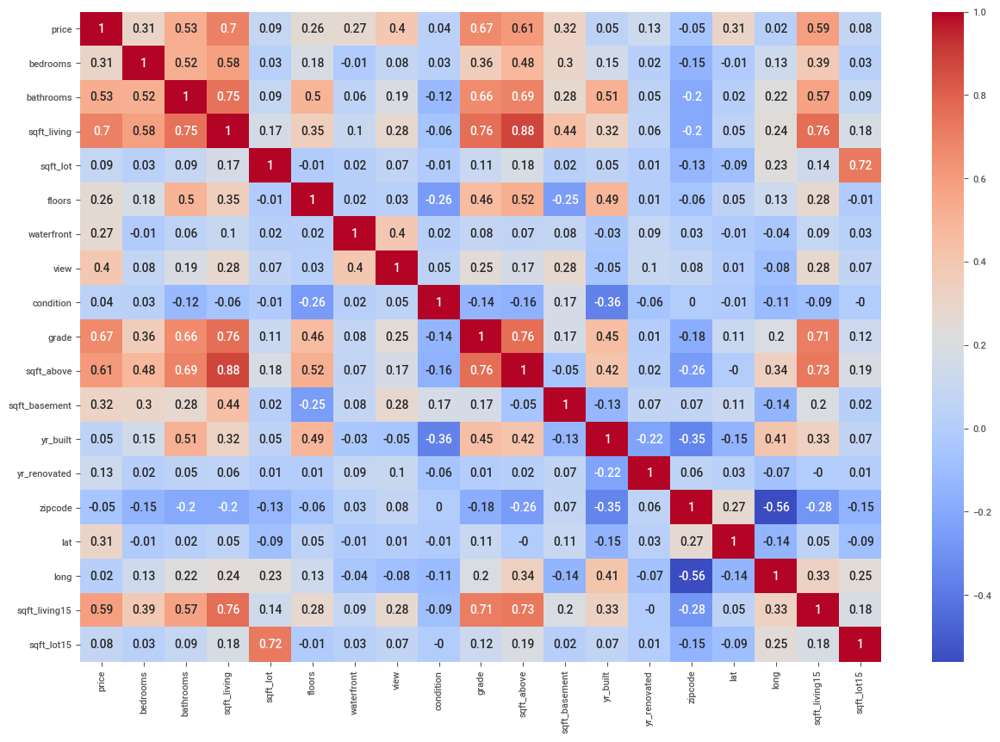

In [11]:
# Visualize the dataset to look for correlations

plt.figure(figsize=(15,10))
sns.heatmap(df.corr().round(2), cmap='coolwarm',annot=True)

In [12]:
# Splitting the "date" column into 3 different values- month,quarter
new_df=df.copy()
new_df["date"]=pd.to_datetime(new_df["date"])
new_df["month"]=pd.DatetimeIndex(new_df['date']).month
new_df["quarter"]=pd.DatetimeIndex(new_df['date']).quarter
new_df=new_df.drop("date",axis=1)
new_df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month,quarter
id,,,,,,,,,,,,,,,,,,,,,
7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,1955,0,98178,47.5112,-122.257,1340,5650,10,4
6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,400,1951,1991,98125,47.7210,-122.319,1690,7639,12,4
5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,1933,0,98028,47.7379,-122.233,2720,8062,2,1
2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,910,1965,0,98136,47.5208,-122.393,1360,5000,12,4
1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,1987,0,98074,47.6168,-122.045,1800,7503,2,1


In [13]:
new_df.groupby("floors").median().hvplot(kind="bar",x="floors",y="price")


:Bars   [floors]   (price)

In [14]:
print(new_df["bedrooms"].value_counts())
new_df=new_df.drop(new_df.loc[new_df["bedrooms"].values>=10,:].index,axis=0)
new_df.groupby("bedrooms").median().hvplot(kind="bar",x="bedrooms",y="price")

3     9824
4     6882
2     2760
5     1601
6      272
1      199
7       38
0       13
8       13
9        6
10       3
33       1
11       1
Name: bedrooms, dtype: int64


:Bars   [bedrooms]   (price)

In [15]:
### Examining longitude and latitude

In [16]:

new_df.hvplot(kind="scatter",title="Price Sqft correlation",figsize=(10,5),x="sqft_living",c="long",y="price")



:Scatter   [sqft_living]   (price,long)

In [17]:
new_df.hvplot(kind="scatter",x="sqft_lot",c="zipcode",y="price")



:Scatter   [sqft_lot]   (price,zipcode)

In [18]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21608 entries, 7129300520 to 1523300157
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21608 non-null  float64
 1   bedrooms       21608 non-null  int64  
 2   bathrooms      21608 non-null  float64
 3   sqft_living    21608 non-null  int64  
 4   sqft_lot       21608 non-null  int64  
 5   floors         21608 non-null  float64
 6   waterfront     21608 non-null  int64  
 7   view           21608 non-null  int64  
 8   condition      21608 non-null  int64  
 9   grade          21608 non-null  int64  
 10  sqft_above     21608 non-null  int64  
 11  sqft_basement  21608 non-null  int64  
 12  yr_built       21608 non-null  int64  
 13  yr_renovated   21608 non-null  int64  
 14  zipcode        21608 non-null  int64  
 15  lat            21608 non-null  float64
 16  long           21608 non-null  float64
 17  sqft_living15  21608 non-null  int64

In [19]:
# Encoding the categorical feature "zipcode"  

# map_dict = {n: cat for n, cat in enumerate(df[col].astype('category').cat.categories)}
#eer_style_dict = {value:key for key, value in convert_cats['beer_style'].items()}
map_dict = {n + 1: cat for n, cat in enumerate(new_df["zipcode"].astype('category').cat.categories)}
new_df["zipcode"] = pd.DataFrame(new_df["zipcode"].astype('category').cat.codes + 1, index=new_df.index)
# map_dict = {n + 1: cat for n, cat in enumerate(new_df["yr_built"].astype('category').cat.categories)}
# new_df["yr_built"] = pd.DataFrame(new_df["yr_built"].astype('category').cat.codes + 1, index=new_df.index)
# map_dict = {n + 1: cat for n, cat in enumerate(new_df["yr_renovated"].astype('category').cat.categories)}
# new_df["yr_renovated"] = pd.DataFrame(new_df["yr_renovated"].astype('category').cat.codes + 1, index=new_df.index)

new_df.head(10)


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month,quarter
id,,,,,,,,,,,,,,,,,,,,,
7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,1955,0,67,47.5112,-122.257,1340,5650,10,4
6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,400,1951,1991,56,47.7210,-122.319,1690,7639,12,4
5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,1933,0,17,47.7379,-122.233,2720,8062,2,1
2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,910,1965,0,59,47.5208,-122.393,1360,5000,12,4
1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,1987,0,38,47.6168,-122.045,1800,7503,2,1
7237550310,1225000.0,4,4.50,5420,101930,1.0,0,0,3,11,...,1530,2001,0,30,47.6561,-122.005,4760,101930,5,2
1321400060,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,...,0,1995,0,3,47.3097,-122.327,2238,6819,6,2
2008000270,291850.0,3,1.50,1060,9711,1.0,0,0,3,7,...,0,1963,0,69,47.4095,-122.315,1650,9711,1,1
2414600126,229500.0,3,1.00,1780,7470,1.0,0,0,3,7,...,730,1960,0,61,47.5123,-122.337,1780,8113,4,2


### Data split and scaling

In [20]:
# Separate the y variable, the labels
new_df.reset_index(drop=True, inplace=True)
y=new_df["price"]
# Separate the X variable, the features
X=new_df.drop(["price"],axis=1)
X[:5]

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month,quarter
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,67,47.5112,-122.257,1340,5650,10,4
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,56,47.7210,-122.319,1690,7639,12,4
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,17,47.7379,-122.233,2720,8062,2,1
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,59,47.5208,-122.393,1360,5000,12,4
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,38,47.6168,-122.045,1800,7503,2,1


In [48]:
# Split the preprocessed data into a training and testing dataset
# Assign the function a random_state equal to 1

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=1)

                                             |          | [  0%]   00:00 -> (? left)

Report Reports/comparison_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



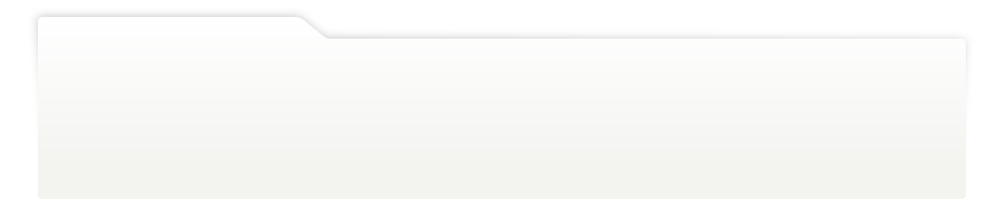
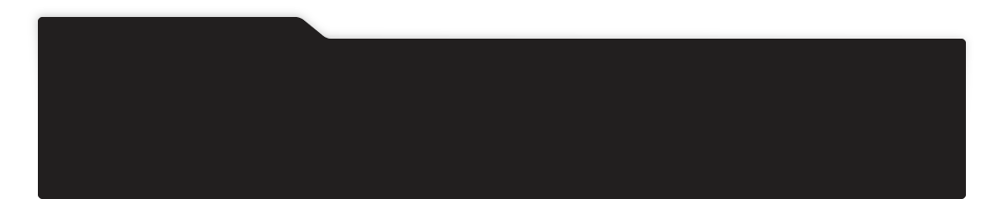
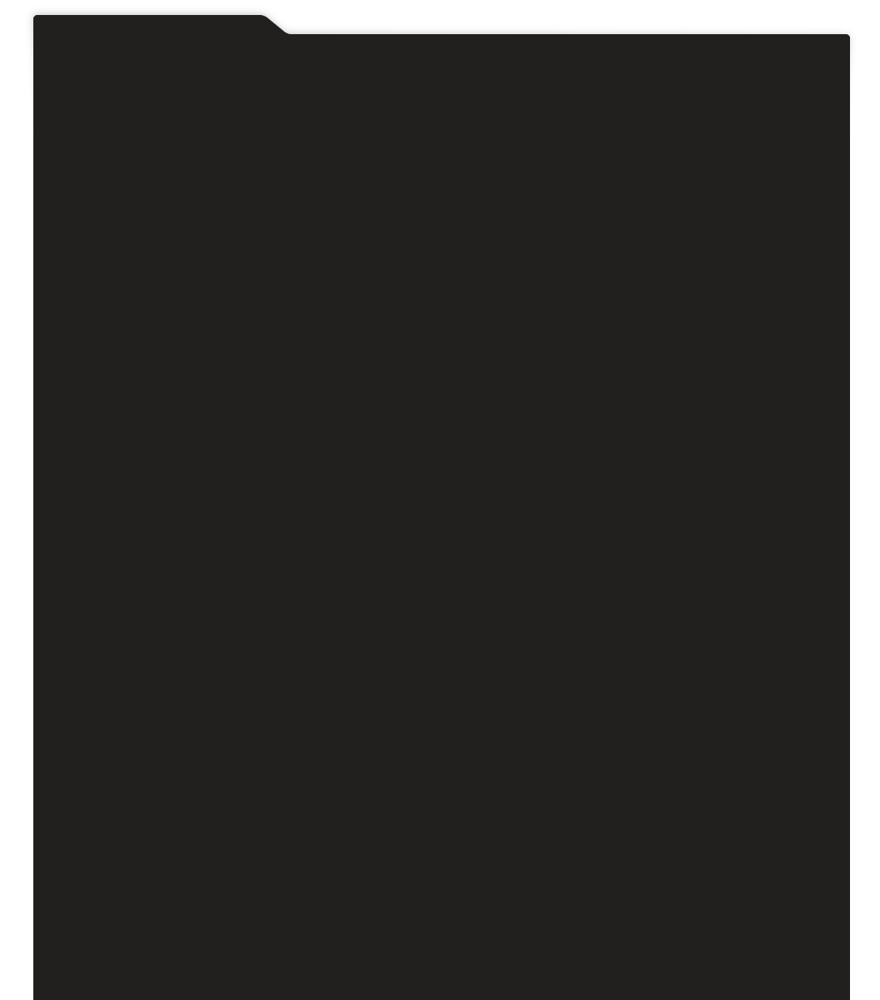
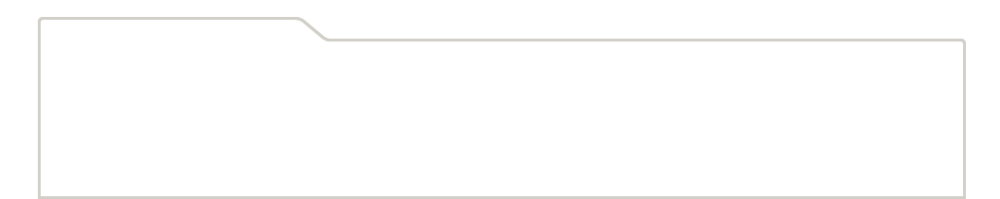
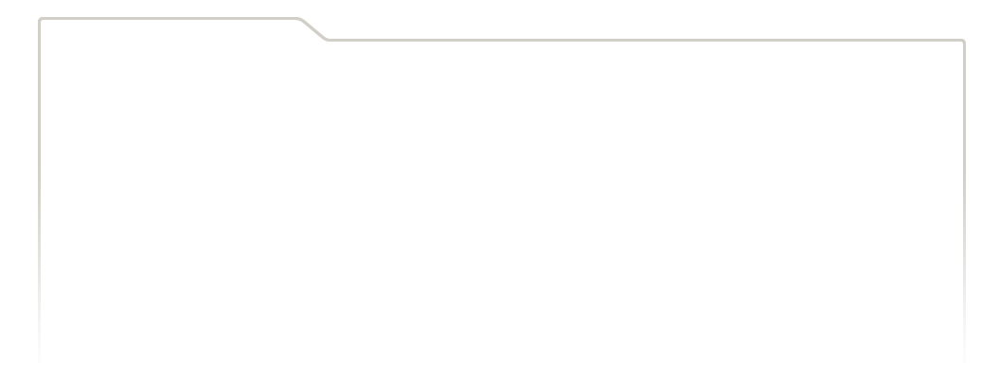
...
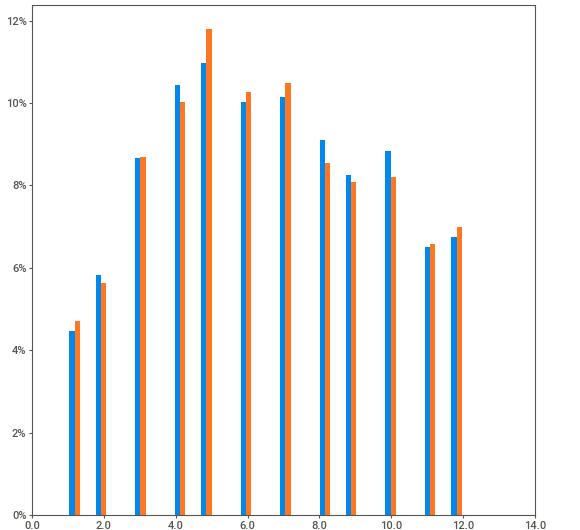
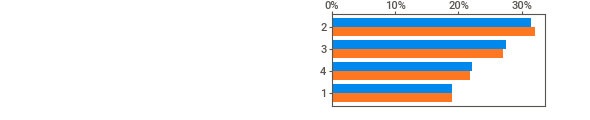
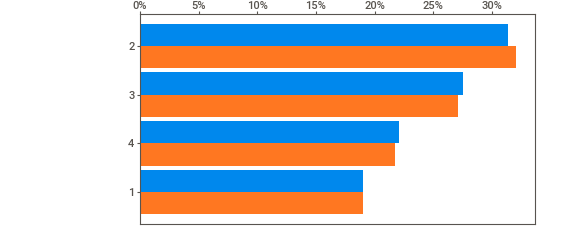
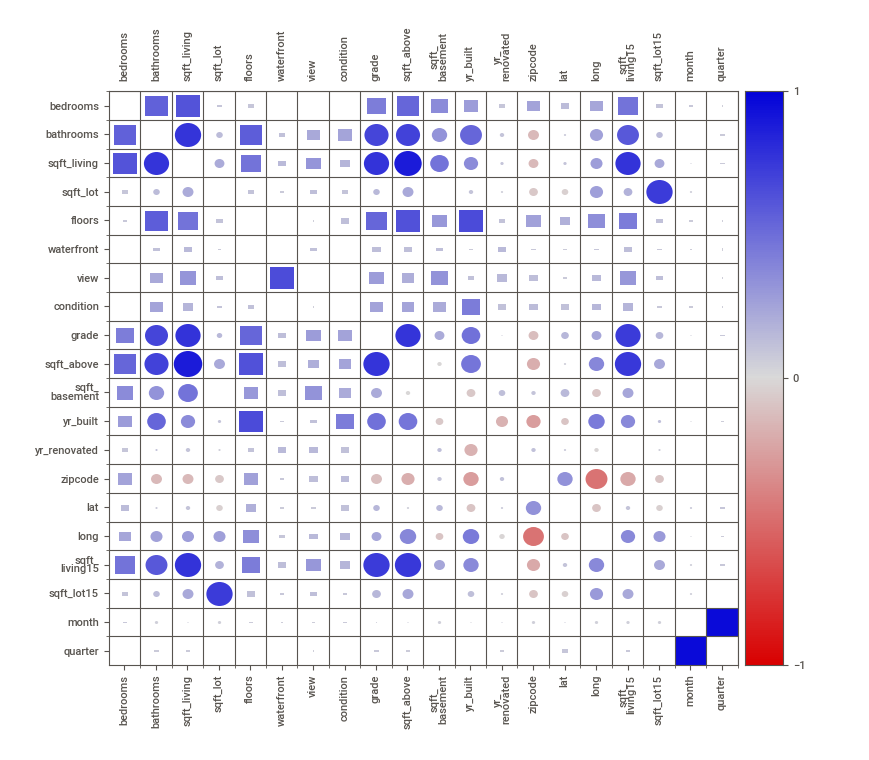
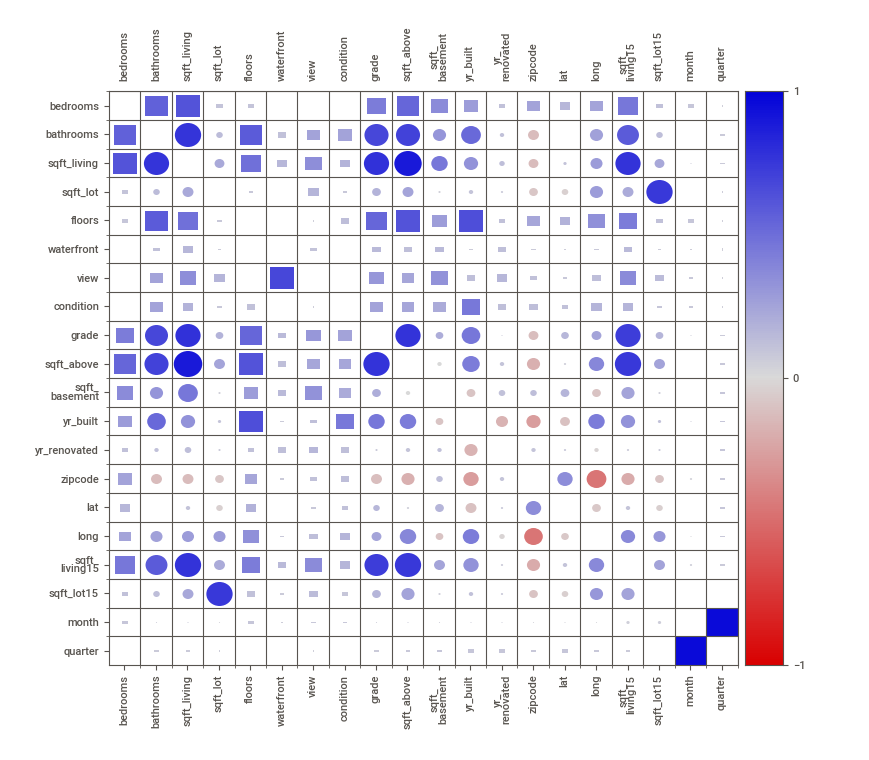

In [27]:
#Comparing Training and Testind data sets

report_comp=sv.compare([X_train, "Train"], [X_test, "Test"])
report_comp.show_html('Reports/comparison_report.html')
report_comp.show_notebook(w=1000,h=800, layout="widescreen")

In [28]:
#         # Create a StandardScaler instance

scaler = StandardScaler()
scaler1 = StandardScaler()

# Fit the scaler to the features training dataset
X_scaler = scaler.fit(X_train)  #scaler.fit_transform(X_train)
# y_scaler = scaler1.fit(y_train.values.reshape(-1,1))

# Fit the scaler to the features training dataset
X_train_scaled =X_scaler.transform(X_train)
X_test_scaled =X_scaler.transform(X_test)

# y_train_scaled =y_scaler.transform(y_train.values.reshape(-1,1))
# y_test_scaled =y_scaler.transform(y_test.values.reshape(-1,1))

## Linear regression

In [29]:
# Initiate model instance , fit the model and preict

model = LinearRegression()
# Fit the model using training data
model.fit(X_train_scaled,y_train)
# Make a prediction using the testing data
y_pred_test=model.predict(X_test_scaled)



In [30]:

# Check the accuracy

from sklearn.metrics import r2_score, mean_absolute_error,mean_absolute_percentage_error, mean_squared_error
# y_test = y_scaler.inverse_transform(y_test_scaled)
# y_pred_test = y_scaler.inverse_transform(y_pred_test)

print(r2_score(y_test,y_pred_test))

print(mean_absolute_error(y_test,y_pred_test))
print(mean_absolute_percentage_error(y_test,y_pred_test))

0.6972378938581922
125469.49084983517
0.2502092252789108


In [31]:
print(model.score(X_train_scaled, y_train))
print(model.score(X_test_scaled, y_test))

0.7025619420508151
0.6972378938581922


In [32]:
#reversing the scaler to   # X_scaler.inverse_transform
pd.DataFrame(X_scaler.inverse_transform(model.coef_).flatten(), X.columns.values)
#if you dont scale X:
# pd.DataFrame(model.coef_.flatten(), X.columns.values) 

,0
bedrooms,-3.062225e+04
bathrooms,2.435450e+04
sqft_living,7.186829e+07
sqft_lot,1.672083e+08
floors,2.511028e+03
waterfront,4.464323e+03
view,2.814042e+04
condition,1.244282e+04
grade,1.385466e+05
sqft_above,6.010071e+07


### K-Means


   bedrooms  bathrooms  sqft_living  sqft_lot    floors  waterfront      view  \
0 -0.407665  -1.447682    -0.979732 -0.228338 -0.915367   -0.087183 -0.305714   
1 -0.407665   0.175932     0.533994 -0.189907  0.936536   -0.087183 -0.305714   
2 -1.514856  -1.447682    -1.426227 -0.123327 -0.915367   -0.087183 -0.305714   
3  0.699527   1.150100    -0.130303 -0.244030 -0.915367   -0.087183 -0.305714   
4 -0.407665  -0.148791    -0.435226 -0.169677 -0.915367   -0.087183 -0.305714   

   condition     grade  sqft_above  sqft_basement  yr_built  yr_renovated  \
0  -0.629098 -0.558855   -0.734591      -0.658561 -0.545131     -0.210034   
1  -0.629098 -0.558855    0.460938       0.245595 -0.681326      4.748826   
2  -0.629098 -1.409558   -1.229709      -0.658561 -1.294205     -0.210034   
3   2.444626 -0.558855   -0.891580       1.398394 -0.204643     -0.210034   
4  -0.629098  0.291849   -0.130789      -0.658561  0.544431     -0.210034   

    zipcode       lat      long  sqft_living15  sq

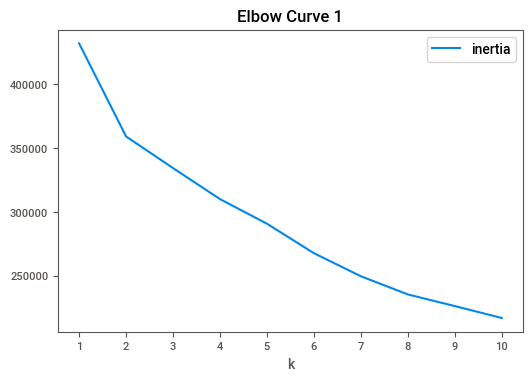

In [33]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Use the `StandardScaler()` module from scikit-learn to normalize the data

new_df=new_df.drop(["price"],axis=1)
scaled_data = StandardScaler().fit_transform(new_df)
# Create a DataFrame with the scaled data
new_df_scaled = pd.DataFrame(
    scaled_data,
    columns=new_df.columns
)


# Display sample data
print(new_df_scaled.head())

# Create a list with the number of k-values to try
k=list(range(1,11))
# Create an empy list to store the inertia values
inertia =[]
# Create a for loop to compute the inertia with each possible value of k
# Inside the loop:
# 1. Create a KMeans model using the loop counter for the n_clusters
# 2. Fit the model to the data 
# 3. Append the model.inertia_ to the inertia list

for i in k:
    model_kmeans=KMeans(n_clusters=i,random_state=0)
    model_kmeans.fit(new_df_scaled)
    inertia.append(model_kmeans.inertia_)
inertia  
# Create a dictionary with the data to plot the Elbow curve
elbow_data={
    "k":k,
    "inertia":inertia
}

# Create a DataFrame with the data to plot the Elbow curve
new_df_elbow_data=pd.DataFrame(elbow_data)
# Plot a line chart with all the inertia values computed with 
# the different values of k to visually identify the optimal value for k.
elbow_chart1 = new_df_elbow_data.plot.line(x="k",y="inertia",title="Elbow Curve 1", xticks=k)

In [34]:
# Initialize the K-Means model using the best value for k
model=KMeans(n_clusters=2,random_state=0)
model.fit(new_df_scaled)

# Predict the clusters to group the cryptocurrencies using the scaled data
scaled_predicted_data=model.predict(new_df_scaled)

# View the resulting array of cluster values.
scaled_predicted_data
# Create a copy of the DataFrame
new_df_predicted_data=new_df_scaled.copy()
new_df_predicted_data["prediction"]=scaled_predicted_data

<AxesSubplot:title={'center':'Clustering with K-means'}, xlabel='sqft_living', ylabel='grade'>

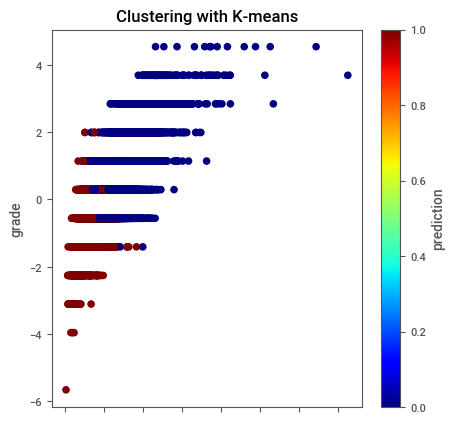

In [35]:
# Create a scatter plot using hvPlot by setting 
scatterplot=new_df_predicted_data.plot(kind="scatter",figsize=(5,5),title="Clustering with K-means",x="sqft_living", y="grade",cmap="jet",c="prediction")
scatterplot

In [36]:
# sorted(list(zip(rf.feature_importances_,df.iloc[:,:-1].columns)))

In [37]:
pca = PCA(n_components=3)
# Use the PCA model with `fit_transform` to reduce to    
# three principal components.
pca_scaled=pca.fit_transform(new_df_scaled)
# View the first five rows of the DataFrame. 
pca_scaled[0:5]

array([[-2.58418043,  0.04909869, -1.78470521],
       [-0.23530562,  1.97251281, -2.15938917],
       [-2.60598072, -0.80388711,  1.99392307],
       [-1.19108436,  2.34423253, -2.00709591],
       [-0.33762891, -1.27126572,  1.9646666 ]])

In [38]:
# Retrieve the explained variance to determine how much information 
# can be attributed to each principal component.
pca.explained_variance_ratio_

array([0.26167524, 0.10921742, 0.09822253])

In [39]:
print(f" The explained vriance ratio is {sum(pca.explained_variance_ratio_)}")

 The explained vriance ratio is 0.4691151873384356


In [40]:
# Create a new DataFrame with the PCA data.

# Creating a DataFrame with the PCA data
pca_data_df=pd.DataFrame(pca_scaled,columns=["PCA1","PCA2","PCA3"])
# Create a list with the number of k-values to try
# Use a range from 1 to 11
k=list(range(1,11))

# Create an empy list to store the inertia values
inertia=[]

for i in k:
    model=KMeans(n_clusters=i,random_state=0)
    model.fit(pca_data_df)
    inertia.append(model.inertia_)
inertia

# Create a dictionary with the data to plot the Elbow curve
elbow_data={
    "k" : k,
    "inertia" : inertia
}
# Create a DataFrame with the data to plot the Elbow curve
df_elbow_data=pd.DataFrame(elbow_data)
elbow_chart2=df_elbow_data.hvplot(width=600,height=300,x="k",y="inertia",title="Elbow Curve using the PCA", xticks=k)
elbow_chart2

:Curve   [k]   (inertia)

In [41]:
# Initialize the K-Means model using the best value for k
model=KMeans(n_clusters=2,random_state=0)
# Fit the K-Means model using the PCA data
model.fit(pca_data_df)
# Predict the clusters to group the cryptocurrencies using the PCA data
house_clusters=model.predict(pca_data_df)

# Create a copy of the DataFrame with the PCA data
pca_predicted_data_df=pca_data_df.copy()
# Add a new column to the DataFrame with the predicted clusters
pca_predicted_data_df["predicted"]=house_clusters
# Display sample data
pca_predicted_data_df
scatterplot_2=pca_predicted_data_df.hvplot.scatter(x="PCA1",y="PCA2",color= "predicted",cmap="jet",title="Scatter plot for PCA=3")
scatterplot_2

:Scatter   [PCA1]   (PCA2,predicted)

In [42]:
df["date"]=pd.to_datetime(df["date"])
df["month"]=pd.DatetimeIndex(df['date']).month
df["quarter"]=pd.DatetimeIndex(df['date']).quarter
df=df.drop("date",axis=1)
df=df.drop(df.loc[df["bedrooms"].values>=10,:].index,axis=0)
df.reset_index(drop=True, inplace=True)
df.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21608 entries, 0 to 21607
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21608 non-null  float64
 1   bedrooms       21608 non-null  int64  
 2   bathrooms      21608 non-null  float64
 3   sqft_living    21608 non-null  int64  
 4   sqft_lot       21608 non-null  int64  
 5   floors         21608 non-null  float64
 6   waterfront     21608 non-null  int64  
 7   view           21608 non-null  int64  
 8   condition      21608 non-null  int64  
 9   grade          21608 non-null  int64  
 10  sqft_above     21608 non-null  int64  
 11  sqft_basement  21608 non-null  int64  
 12  yr_built       21608 non-null  int64  
 13  yr_renovated   21608 non-null  int64  
 14  zipcode        21608 non-null  int64  
 15  lat            21608 non-null  float64
 16  long           21608 non-null  float64
 17  sqft_living15  21608 non-null  int64  
 18  sqft_l

In [43]:
df_clustered=pd.concat([df,pca_predicted_data_df["predicted"]],axis=1)
df_clustered

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month,quarter,predicted
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,1955,0,98178,47.5112,-122.257,1340,5650,10,4,0
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,1951,1991,98125,47.7210,-122.319,1690,7639,12,4,0
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,1933,0,98028,47.7379,-122.233,2720,8062,2,1,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,1965,0,98136,47.5208,-122.393,1360,5000,12,4,0
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,1987,0,98074,47.6168,-122.045,1800,7503,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21603,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,...,2009,0,98103,47.6993,-122.346,1530,1509,5,2,0
21604,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,...,2014,0,98146,47.5107,-122.362,1830,7200,2,1,1
21605,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,...,2009,0,98144,47.5944,-122.299,1020,2007,6,2,0
21606,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,...,2004,0,98027,47.5345,-122.069,1410,1287,1,1,1


In [44]:
# Separate the y variable, the labels
y=df_clustered["price"]
# Separate the X variable, the features
X=df_clustered.drop(["price"],axis=1)
X[:5]

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month,quarter,predicted
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,...,1955,0,98178,47.5112,-122.257,1340,5650,10,4,0
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,...,1951,1991,98125,47.7210,-122.319,1690,7639,12,4,0
2,2,1.00,770,10000,1.0,0,0,3,6,770,...,1933,0,98028,47.7379,-122.233,2720,8062,2,1,0
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,...,1965,0,98136,47.5208,-122.393,1360,5000,12,4,0
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,...,1987,0,98074,47.6168,-122.045,1800,7503,2,1,0


### GradientBoost

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=101)

In [53]:
# Initiate model instance , fit the model and preict

grboost=GradientBoostingRegressor(random_state=1)
# Fit the model using training data
grboost.fit(X_train,y_train)
# Make a prediction using the testing data
y_pred_test=grboost.predict(X_test)

In [54]:
print(grboost.score(X_train, y_train))
print(grboost.score(X_test, y_test))


print(r2_score(y_test,y_pred_test))
print(mean_absolute_error(y_test,y_pred_test))
print(mean_absolute_percentage_error(y_test,y_pred_test))

0.9009086752732338
0.862631975138886
0.862631975138886
76427.01642475734
0.14769573222358243


In [55]:
importance_grboost = grboost.feature_importances_
importance_grboost = pd.DataFrame(importance_grboost, index=X.columns, columns=['Importance'])


In [56]:
importance_grboost.sort_values(by=['Importance'], ascending=False)

,Importance
sqft_living,0.313483
grade,0.309115
lat,0.159689
long,0.060441
waterfront,0.033082
yr_built,0.032587
view,0.025654
sqft_living15,0.023481
zipcode,0.014668
sqft_above,0.012336


### Cecking the accuracy based on new features

In [57]:
#Defining various models

#1. Linear Regressor model
from sklearn.linear_model import LinearRegression
lr_new=LinearRegression()

#2. Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
dt_new=DecisionTreeRegressor(random_state=1,criterion='mse',max_depth=10)

#3.Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
rf_new=RandomForestRegressor(random_state=1,n_estimators=100,max_depth=10)

#4. KNN
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsRegressor
knn_new=KNeighborsRegressor(n_neighbors=10)

#5.Boosting
from sklearn.ensemble import GradientBoostingRegressor
grboost_new=GradientBoostingRegressor(random_state=1)

In [58]:
# Create a function that returns train and test accuracy of different models.

def accuracy_new(model):
    model.fit(X_train,y_train)
#   train_accuracy = model.score(X_train, y_train)
    train_accuracy = model.score(X_train, y_train)
    train_accuracy = np.round(train_accuracy*100, 2)
    test_accuracy = model.score(X_test, y_test)
    test_accuracy = np.round(test_accuracy*100, 2)
    return train_accuracy,test_accuracy

In [59]:
# Create DataFrame that illustrates the accuracy of tmodels
accuracy_new_df=pd.DataFrame([accuracy_new(lr), accuracy_new(dt), accuracy_new(rf), 
                                           accuracy_new(knn), accuracy_new(grboost)])
accuracy_new_df.index = ['LinearReg', 'DecisionTree','RandomForest','KNN','GradienBoost']
accuracy_new_df.columns=['Train_accuracy(%)','Test_accuracy(%)']
sorted_accuracy_new_df = accuracy_new_df.sort_values(by = 'Train_accuracy(%)', ascending = False)
sorted_accuracy_new_df

,Train_accuracy(%),Test_accuracy(%)
RandomForest,93.53,85.35
DecisionTree,91.34,76.61
GradienBoost,90.09,86.26
LinearReg,69.91,71.02
KNN,59.60,52.81
